[View in Colaboratory](https://colab.research.google.com/github/ZER-0-NE/ML_problems/blob/master/CFPS_sept.ipynb)

In [1]:
from google.colab import auth
auth.authenticate_user()

!pip install PyDrive

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

    100% |████████████████████████████████| 993kB 6.5MB/s 
  Running setup.py bdist_wheel for PyDrive ... - done
  Stored in directory: /root/.cache/pip/wheels/fa/d2/9a/d3b6b506c2da98289e5d417215ce34b696db856643bad779f4
Successfully built PyDrive


In [2]:
fileId = drive.CreateFile({'id': '1BArccFt9lKKFnoZDTh9gUNfaS8GHnIp9'}) #DRIVE_FILE_ID is file id example: 1iytA1n2z4go3uVCwE_vIKouTKyIDjEq
print(fileId['title'])  # folder_data.zip
fileId.GetContentFile('dataset_cfps.zip')  # Save Drive file as a local file

!unzip dataset_cfps.zip -d ./

new_drk_t.zip
Archive:  dataset_cfps.zip
   creating: ./cropped_val/
   creating: ./cropped_val/Angelman/
  inflating: ./cropped_val/Angelman/Angelman607.jpg  
  inflating: ./cropped_val/Angelman/Angelman687.jpg  
  inflating: ./cropped_val/Angelman/Angelman691.jpg  
  inflating: ./cropped_val/Angelman/Angelman695.jpg  
  inflating: ./cropped_val/Angelman/Angelman699.jpg  
  inflating: ./cropped_val/Angelman/Angelman703.jpg  
  inflating: ./cropped_val/Angelman/Angelman707.jpg  
  inflating: ./cropped_val/Angelman/Angelman714.jpg  
  inflating: ./cropped_val/Angelman/Angelman718.jpg  
  inflating: ./cropped_val/Angelman/Angelman719.jpg  
  inflating: ./cropped_val/Angelman/Angelman723.jpg  
  inflating: ./cropped_val/Angelman/Angelman727.jpg  
  inflating: ./cropped_val/Angelman/Angelman731.jpg  
  inflating: ./cropped_val/Angelman/Angelman735.jpg  
  inflating: ./cropped_val/Angelman/Angelman739.jpg  
  inflating: ./cropped_val/Angelman/Angelman743.jpg  
  inflating: ./cropped_val/Ang

In [3]:
fileId = drive.CreateFile({'id': '1nObt5ZEbwbJ62sFyfpuFO63o-tvThtvC'}) #DRIVE_FILE_ID is file id example: 1iytA1n2z4go3uVCwE_vIKouTKyIDjEq
print(fileId['title'])  # folder_data.zip
fileId.GetContentFile('test_img.zip')  # Save Drive file as a local file

!unzip test_img.zip -d ./

test_cro.zip
Archive:  test_img.zip
   creating: ./test_cropped/
   creating: ./test_cropped/Angelman/
  inflating: ./test_cropped/Angelman/Angelman (1).jpg  
  inflating: ./test_cropped/Angelman/Angelman (10).jpg  
  inflating: ./test_cropped/Angelman/Angelman (2).jpg  
  inflating: ./test_cropped/Angelman/Angelman (3).jpg  
  inflating: ./test_cropped/Angelman/Angelman (4).jpg  
  inflating: ./test_cropped/Angelman/Angelman (5).jpg  
  inflating: ./test_cropped/Angelman/Angelman (6).jpg  
  inflating: ./test_cropped/Angelman/Angelman (7).jpg  
  inflating: ./test_cropped/Angelman/Angelman (8).jpg  
  inflating: ./test_cropped/Angelman/Angelman (9).jpg  
  inflating: ./test_cropped/Angelman/Angelman1.jpg  
  inflating: ./test_cropped/Angelman/Angelman2.jpg  
  inflating: ./test_cropped/Angelman/Angelman3.jpg  
  inflating: ./test_cropped/Angelman/Angelman4.jpg  
  inflating: ./test_cropped/Angelman/Angelman5.jpg  
  inflating: ./test_cropped/Angelman/Angelman6.jpg  
  inflating: ./tes

In [4]:
!pip install keras_vggface
from keras import models
from keras import layers
from keras import optimizers
from keras.applications import VGG16
from keras.applications import InceptionResNetV2
import sys, numpy
import os
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers, regularizers
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense, Activation, Input
from keras.layers.convolutional import Convolution2D, MaxPooling2D
from keras import callbacks, regularizers
from keras.models import load_model
import matplotlib.pyplot as plt 
from keras.layers.normalization import BatchNormalization
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K
from keras_vggface.vggface import VGGFace
from keras.engine import  Model
from keras.models import load_model
from keras.layers import Conv2D, GlobalAveragePooling2D
from sklearn import metrics

  Running setup.py bdist_wheel for keras-vggface ... - done
  Stored in directory: /root/.cache/pip/wheels/72/aa/01/eb7baeb2f6e2d2f0d2aabddb5f01d57fa22fbd019ee2799bf5
Successfully built keras-vggface


Using TensorFlow backend.


In [ ]:
train_data_path = 'dataset_cfps_cropped/cropped_train'
validation_data_path = 'dataset_cfps_cropped/cropped_val'
test_data_path = 'dataset_cfps_cropped/test'
#Parametres
img_width, img_height = 160, 160

# path to the model weights files.
weights_path = 'keras-facenet/weights/facenet_keras_weights.h5'
top_model_weights_path = 'keras-facenet/model/facenet_keras.h5'

nb_train_samples = 1774
nb_validation_samples = 313
epochs = 50
batch_size = 16

94699520/94694792 [==============================] - 13s 0us/step
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1/7x7_s2 (Conv2D)           (None, 112, 112, 64) 9408        input_1[0][0]                    
__________________________________________________________________________________________________
conv1/7x7_s2/bn (BatchNormaliza (None, 112, 112, 64) 256         conv1/7x7_s2[0][0]               
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 112, 112, 64) 0           conv1/7x7_s2/bn[0][0]            
___________________________________________

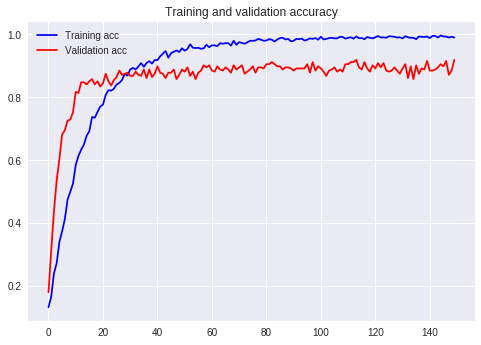

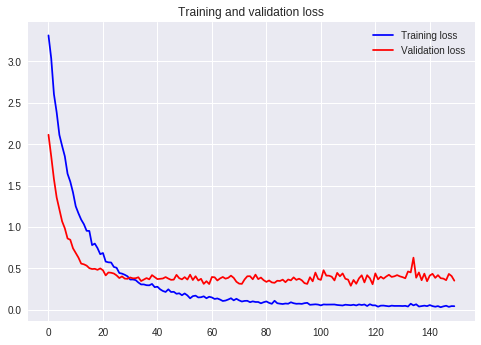

Found 146 images belonging to 8 classes.


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


                  precision    recall  f1-score   support

        Angelman       0.00      0.00      0.00        21
           Apert       0.00      0.00      0.00        20
             CDL       0.00      0.00      0.00        25
            Down       0.14      0.74      0.23        19
        FragileX       0.00      0.00      0.00        17
        Progeria       0.00      0.00      0.00        11
Treacher Collins       0.00      0.00      0.00        10
        Williams       0.22      0.43      0.29        23

     avg / total       0.05      0.16      0.08       146

Found 146 images belonging to 8 classes.
15/14 [==============================] - 3s 202ms/step
No of errors = 132/146


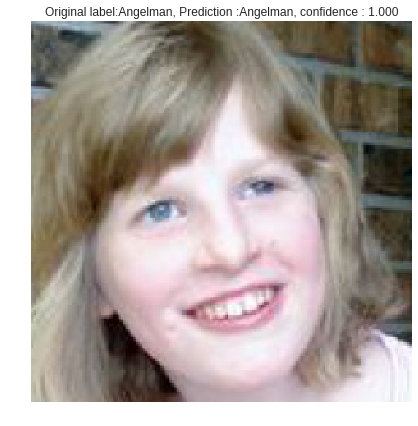

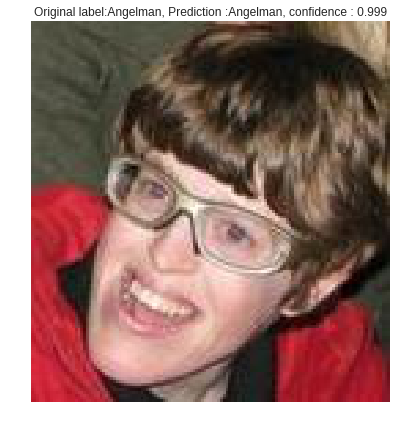

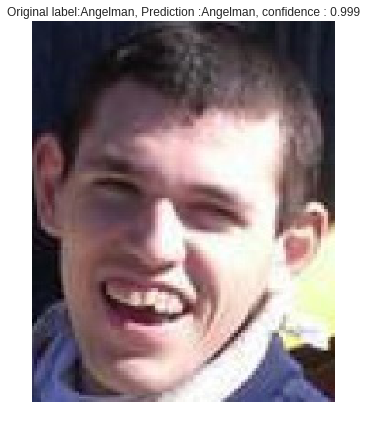

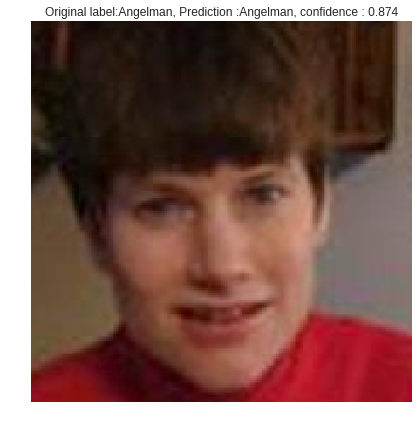

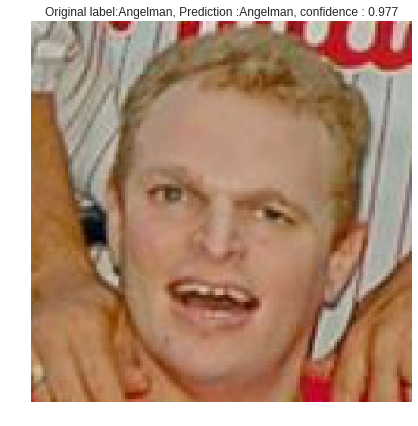

...

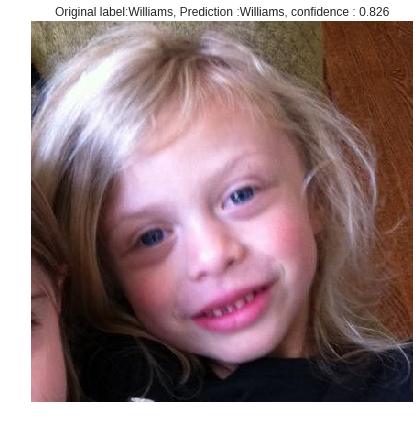

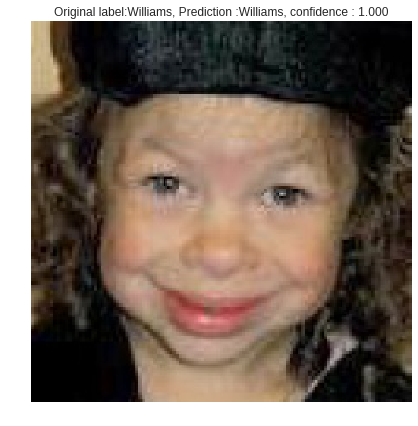

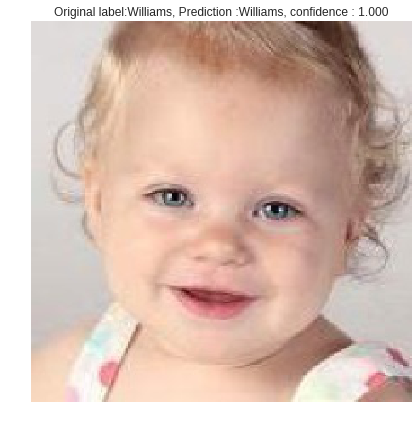

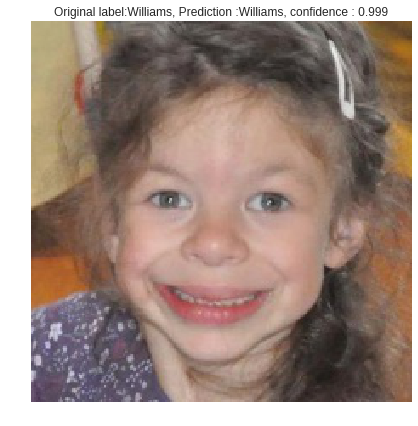

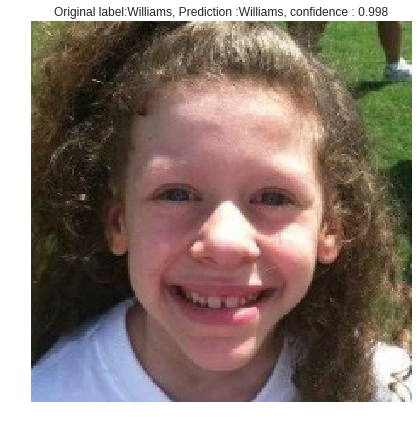

Confusion matrix, without normalization
[[18  1  0  0  2  0  0  0]
 [ 0 20  0  0  0  0  0  0]
 [ 0  0 23  0  0  0  0  2]
 [ 0  0  0 16  1  2  0  0]
 [ 3  0  0  0 14  0  0  0]
 [ 0  0  0  0  0 11  0  0]
 [ 0  0  0  0  0  0 10  0]
 [ 2  0  0  0  1  0  0 20]]


NameError: ignored

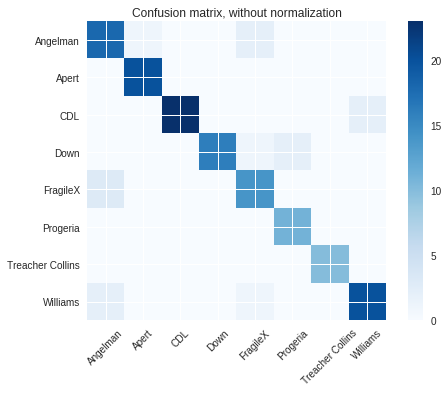

In [6]:
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint

train_data_path = 'cropped_train'
validation_data_path = 'cropped_val'
test_data_path = 'test_cropped'
#Parametres
img_width, img_height = 224, 224

#Load the VGG model
#vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))

vggface = VGGFace(model='resnet50', include_top=False, input_shape=(img_width, img_height, 3))
vggface.summary()
#vgg_model = VGGFace(include_top=False, input_shape=(224, 224, 3))

last_layer = vggface.get_layer('avg_pool').output
x = Flatten(name='flatten')(last_layer)
xx = Dense(256, activation = 'relu')(x)
x1 = BatchNormalization()(xx)
x2 = Dropout(0.5)(x1)

y = Dense(256, activation = 'relu')(x2)
yy = BatchNormalization()(y)
y1 = Dropout(0.5)(yy)

z = Dense(256, activation = 'relu')(y1)
zz = BatchNormalization()(z)
z1 = Dropout(0.5)(zz)

x3 = Dense(8, activation='softmax', name='classifier')(z1)

custom_vgg_model = Model(vggface.input, x3)


# Create the model
model = models.Sequential()
 
# Add the convolutional base model
model.add(custom_vgg_model)
 
# Add new layers
#model.add(layers.Flatten())
# model.add(layers.Dense(1024, activation='relu'))
# model.add(BatchNormalization())
#model.add(layers.Dropout(0.5))
# model.add(layers.Dense(12, activation='sigmoid'))
 
# Show a summary of the model. Check the number of trainable parameters
#model.summary()
#model = load_model('keras_vggface_3FC_cropped.h5')

def precision(y_true, y_pred):
    """Precision metric.
    Only computes a batch-wise average of precision.
    Computes the precision, a metric for multi-label classification of
    how many selected items are relevant.
    """
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision


def recall(y_true, y_pred):
    """Recall metric.
    Only computes a batch-wise average of recall.
    Computes the recall, a metric for multi-label classification of
    how many relevant items are selected.
    """
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall


def fbeta_score(y_true, y_pred, beta=1):
    """Computes the F score.
    The F score is the weighted harmonic mean of precision and recall.
    Here it is only computed as a batch-wise average, not globally.
    This is useful for multi-label classification, where input samples can be
    classified as sets of labels. By only using accuracy (precision) a model
    would achieve a perfect score by simply assigning every class to every
    input. In order to avoid this, a metric should penalize incorrect class
    assignments as well (recall). The F-beta score (ranged from 0.0 to 1.0)
    computes this, as a weighted mean of the proportion of correct class
    assignments vs. the proportion of incorrect class assignments.
    With beta = 1, this is equivalent to a F-measure. With beta < 1, assigning
    correct classes becomes more important, and with beta > 1 the metric is
    instead weighted towards penalizing incorrect class assignments.
    """
    if beta < 0:
        raise ValueError('The lowest choosable beta is zero (only precision).')

    # If there are no true positives, fix the F score at 0 like sklearn.
    if K.sum(K.round(K.clip(y_true, 0, 1))) == 0:
        return 0

    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    bb = beta ** 2
    fbeta_score = (1 + bb) * (p * r) / (bb * p + r + K.epsilon())
    return fbeta_score


def fmeasure(y_true, y_pred):
    """Computes the f-measure, the harmonic mean of precision and recall.
    Here it is only computed as a batch-wise average, not globally.
    """
    return fbeta_score(y_true, y_pred, beta=1)

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=20,
      width_shift_range=0.2,
      height_shift_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')
 

validation_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=20,
      width_shift_range=0.2,
      height_shift_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')
 
# Change the batchsize according to your system RAM
train_batchsize = 50
val_batchsize = 10
 
train_generator = train_datagen.flow_from_directory(
        train_data_path,
        target_size=(img_width, img_height),
        batch_size=train_batchsize,
        class_mode='categorical')
 
validation_generator = validation_datagen.flow_from_directory(
        validation_data_path,
        target_size=(img_width, img_height),
        batch_size=val_batchsize,
        class_mode='categorical')

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                              patience=100, min_lr=1e-8)

checkpoint = ModelCheckpoint(filepath='checkpoint-{epoch:02d}-{val_loss:.2f}.hdf5', monitor='val_loss', verbose=0, save_best_only=True)


# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum = 0.9),
              metrics=['acc'])
# Train the model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=150,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1, 
      callbacks=[checkpoint])
 
# Save the model
model.save('keras_vggface_3FC_new_drk_150.h5')

# loss and accuracy curves.
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

test_generator = ImageDataGenerator()
test_data_generator = test_generator.flow_from_directory(
    test_data_path,
     target_size=(img_width, img_height),
    batch_size=32,
    class_mode='categorical',
    shuffle=False)
test_steps_per_epoch = numpy.math.ceil(test_data_generator.samples / test_data_generator.batch_size)

predictions = model.predict_generator(test_data_generator, steps=test_steps_per_epoch)
# Get most likely class
predicted_classes = numpy.argmax(predictions, axis=1)

true_classes = test_data_generator.classes
class_labels = list(test_data_generator.class_indices.keys())   

report = metrics.classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)   

from keras.models import load_model
from sklearn.metrics import confusion_matrix
#model = load_model('checkpoint-67-0.48.hdf5')
test_data_path = 'test_cropped'
import numpy as np
from keras.preprocessing import image

img_width, img_height  =224, 224

validation_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=20,
      width_shift_range=0.2,
      height_shift_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        test_data_path,
        target_size=(img_width, img_height),
        batch_size=10,
        class_mode='categorical',
        shuffle=False)
 
# Get the filenames from the generator
fnames = validation_generator.filenames
 
# Get the ground truth from generator
ground_truth = validation_generator.classes
 
# Get the label to class mapping from the generator
label2index = validation_generator.class_indices
 
# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())
 
# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)
 
errors = np.where(predicted_classes == ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))
 
# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
     
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
     
    original = image.load_img('{}/{}'.format(test_data_path,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()


cm = confusion_matrix(ground_truth, predicted_classes)
cm


def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

plt.figure()
cm_label = [ 'Angelman', 'Apert', 'CDL','Down', 'FragileX','Progeria', 'Treacher Collins', 'Williams']
plot_confusion_matrix(cm, classes=cm_label,
                      title='Confusion matrix, without normalization')
plt.figure()
plot_confusion_matrix(cm, classes=cm_label, normalize=True,
                      title='Normalized confusion matrix')
plt.show()


TruePositive = np.diag(cm)
print("TP is" + str(TruePositive) )

FalsePositive = []
for i in range(8):
    FalsePositive.append(sum(cm[:,i]) - cm[i,i])

print("FP is" + str(FalsePositive) )
    
    
FalseNegative = []
for i in range(8):
    FalseNegative.append(sum(cm[i,:]) - cm[i,i])

    
print("FN is" + str(FalseNegative) )


TrueNegative = []
for i in range(8):
    temp = np.delete(cm, i, 0)   # delete ith row
    temp = np.delete(temp, i, 1)  # delete ith column
    TrueNegative.append(sum(sum(temp)))
    
    
print("TN is" + str(TrueNegative) )   

l = len(predicted_classes)
for i in range(8):
    print(TruePositive[i] + FalsePositive[i] + FalseNegative[i] + TrueNegative[i] == l)

In [ ]:
from google.colab import files
files.download('keras_vggface_3FC_new_drk_150.h5')

----------------------------------------
Exception happened during processing of request from ('::ffff:127.0.0.1', 56838, 0, 0)
Traceback (most recent call last):
  File "/usr/lib/python3.6/socketserver.py", line 317, in _handle_request_noblock
    self.process_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 348, in process_request
    self.finish_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 361, in finish_request
    self.RequestHandlerClass(request, client_address, self)
  File "/usr/lib/python3.6/socketserver.py", line 696, in __init__
    self.handle()
  File "/usr/lib/python3.6/http/server.py", line 418, in handle
    self.handle_one_request()
  File "/usr/lib/python3.6/http/server.py", line 406, in handle_one_request
    method()
  File "/usr/lib/python3.6/http/server.py", line 639, in do_GET
    self.copyfile(f, self.wfile)
  File "/usr/lib/python3.6/http/server.py", line 800, in copyfile
    shutil.copyfil

In [6]:
!pip install keras_vggface

  Running setup.py bdist_wheel for keras-vggface ... - done
  Stored in directory: /content/.cache/pip/wheels/72/aa/01/eb7baeb2f6e2d2f0d2aabddb5f01d57fa22fbd019ee2799bf5
Successfully built keras-vggface


In [4]:
!pip install keras_vggface
from keras_vggface.vggface import VGGFace

  Running setup.py bdist_wheel for keras-vggface ... - done
  Stored in directory: /content/.cache/pip/wheels/72/aa/01/eb7baeb2f6e2d2f0d2aabddb5f01d57fa22fbd019ee2799bf5
Successfully built keras-vggface


Using TensorFlow backend.


In [5]:
vggface = VGGFace().summary()

508715008/580070376 [=========================>....] - ETA: 6s580075520/580070376 [==============================] - 50s 0us/step
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
conv1_1 (Conv2D)             (None, 224, 224, 64)      1792      
_________________________________________________________________
conv1_2 (Conv2D)             (None, 224, 224, 64)      36928     
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 112, 112, 64)      0         
_________________________________________________________________
conv2_1 (Conv2D)             (None, 112, 112, 128)     73856     
_________________________________________________________________
conv2_2 (Conv2D)             (None, 112, 112, 128)     147584    
____________